# **ECSE415 A2**

Student name: Zhiheng Zhou

Student ID: 260955157


# **Path**

In [1]:
path='/content/drive/MyDrive/ECSE415/Colab Notebooks_A2/'

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import cv2
import numpy as np

%matplotlib inline

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


****

# **1.  Harris Corner Detection**

# **Read Image**

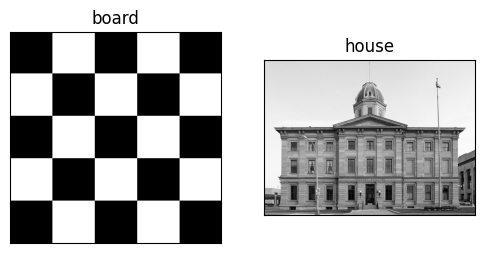

In [2]:
# Read in the image
board1 = cv2.imread(path + 'checkerboard.png')
house1 = cv2.imread(path + 'courthouse_gray.jpg')

# Convert from RGB value to GBR value
board = cv2.cvtColor(board1, cv2.COLOR_BGR2RGB)
house = cv2.cvtColor(house1, cv2.COLOR_BGR2RGB)

boardCopy = board.copy()
houseCopy = house.copy()

plt.figure(figsize=(6,8))
plt.subplot(121), plt.imshow(board)
plt.title("board"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(house)
plt.title("house"), plt.xticks([]), plt.yticks([])

plt.show()

# **Grayscale**

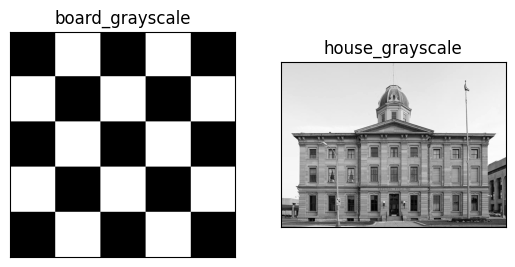

In [3]:
 # Grayscale average
gray = [0.333, 0.333, 0.333]

# Getting grayscale image using grascale average to avoid matrix dimension error
board = np.dot(board, gray)
house = np.dot(house, gray)

# Display
plt.subplot(121), plt.imshow(board, cmap='gray')
plt.title("board_grayscale"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(house, cmap='gray')
plt.title("house_grayscale"), plt.xticks([]), plt.yticks([])

plt.show()

# **1.1   Compute the image derivatives**

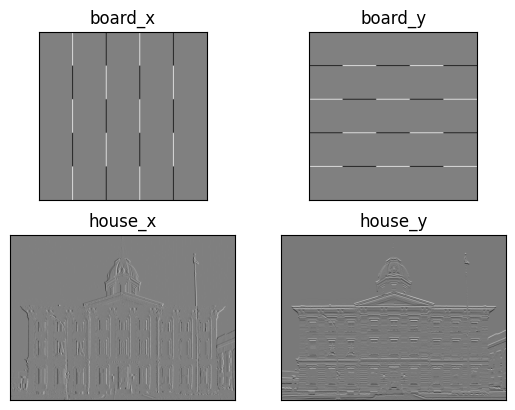

In [4]:
# Sobel filter in x and y
kernel_sobel_x = np.array([[ -1, 0, 1],[ -2, 0, 2],[ -1, 0, 1]])
kernel_sobel_y = np.array([[ 1, 2, 1],[ 0, 0, 0],[ -1, -2, -1]])

# Computing the image gradient in x-direction and y-direction using Sobel derivative filters.
board_x = cv2.filter2D(board, -1, kernel_sobel_x)
board_y = cv2.filter2D(board, -1, kernel_sobel_y)
house_x = cv2.filter2D(house, -1, kernel_sobel_x)
house_y = cv2.filter2D(house, -1, kernel_sobel_y)

# Display
plt.subplot(221), plt.imshow(board_x, cmap='gray')
plt.title("board_x"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(board_y, cmap='gray')
plt.title("board_y"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(house_x, cmap='gray')
plt.title("house_x"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(house_y, cmap='gray')
plt.title("house_y"), plt.xticks([]), plt.yticks([])
plt.show()

# **1.2 Compute the square of the derivatives**

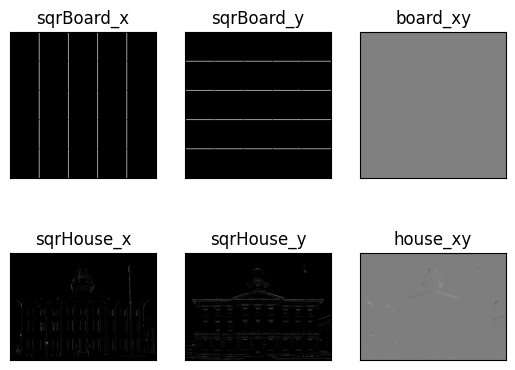

In [5]:
# board: Ix^2, Iy^2, IxIy
sqrBoard_x = pow(board_x, 2)
sqrBoard_y = pow(board_y, 2)
board_xy = board_x * board_y

# house: Ix^2, Iy^2, IxIy
sqrHouse_x = pow(house_x, 2)
sqrHouse_y = pow(house_y, 2)
house_xy = house_x * house_y

# Display
plt.subplot(231), plt.imshow(sqrBoard_x, cmap='gray')
plt.title("sqrBoard_x"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(sqrBoard_y, cmap='gray')
plt.title("sqrBoard_y"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(board_xy, cmap='gray')
plt.title("board_xy"), plt.xticks([]), plt.yticks([])
plt.subplot(234), plt.imshow(sqrHouse_x, cmap='gray')
plt.title("sqrHouse_x"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(sqrHouse_y, cmap='gray')
plt.title("sqrHouse_y"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(house_xy, cmap='gray')
plt.title("house_xy"), plt.xticks([]), plt.yticks([])
plt.show()

# **1.3 Apply Gaussian Filtering on the output of Step 2**

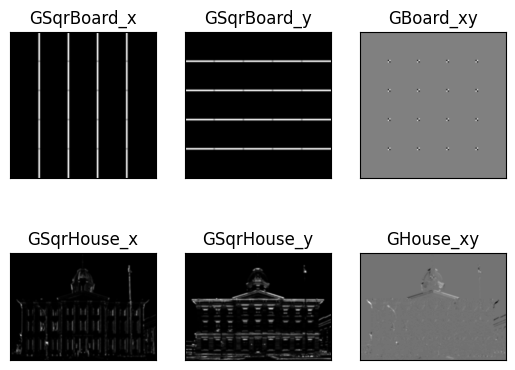

In [6]:
# Smoothing squre of derivative of images using 11x11 Gaussian kernel
GSqrBoard_x = cv2.GaussianBlur(sqrBoard_x, (11, 11), 2)
GSqrBoard_y = cv2.GaussianBlur(sqrBoard_y, (11, 11), 2)
GBoard_xy = cv2.GaussianBlur(board_xy, (11, 11), 2)

# Smoothing squre of derivative of images using 11x11 Gaussian kernel
GSqrHouse_x = cv2.GaussianBlur(sqrHouse_x, (11, 11), 2)
GSqrHouse_y = cv2.GaussianBlur(sqrHouse_y, (11, 11), 2)
GHouse_xy = cv2.GaussianBlur(house_xy , (11, 11), 2)

# Plotting smoothed grayscale images (11x11 Gaussian kernel)
plt.subplot(231), plt.imshow(GSqrBoard_x, cmap='gray')
plt.title("GSqrBoard_x"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(GSqrBoard_y, cmap='gray')
plt.title("GSqrBoard_y"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(GBoard_xy, cmap='gray')
plt.title("GBoard_xy"), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(GSqrHouse_x, cmap='gray')
plt.title("GSqrHouse_x"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(GSqrHouse_y, cmap='gray')
plt.title("GSqrHouse_y"), plt.xticks([]), plt.yticks([])
plt.subplot(236), plt.imshow(GHouse_xy, cmap='gray')
plt.title("GHouse_xy"), plt.xticks([]), plt.yticks([])

plt.show()

# **1.4 Compute the cornerness function response**

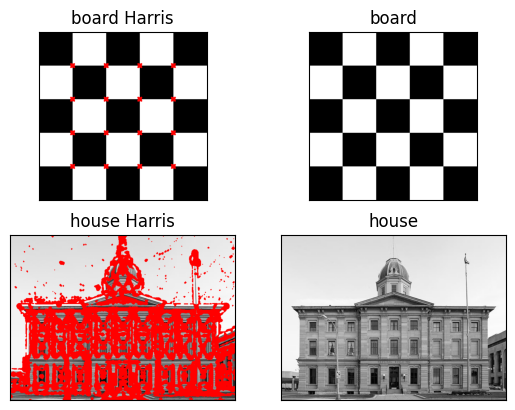

In [7]:
# Computing corness function, where k = 0.05
harBoard = GSqrBoard_x * GSqrBoard_y - pow(GBoard_xy, 2) - 0.05 * (pow(GSqrBoard_x + GSqrBoard_y, 2))
harHouse = GSqrHouse_x * GSqrHouse_y - pow(GHouse_xy, 2) - 0.05 * (pow(GSqrHouse_x+GSqrHouse_y, 2))

#This piece of code is taking from Tutorial 3 - Image Processing in OpenCV
# threshold for an optimal value
thres = 50

# list all points higher than threshold
locB = np.where(harBoard >= thres)
locH = np.where(harHouse >= thres)

 # This function is used to normalize the corner response map to the range [0, 2] for better visualization.
 # It ensures that the corners with the highest response have a value of 2, and lower corners have values in between.
cv2.normalize(harBoard, harBoard, 0, 2, cv2.NORM_MINMAX)
cv2.normalize(harHouse, harHouse, 0, 2, cv2.NORM_MINMAX)

# loop though points
for pt in zip(*locB[::-1]):
    # draw filled circle on each point
    # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
    cv2.circle(boardCopy, pt, 1, (255,0,0), -1)

# loop though points
for pt in zip(*locH[::-1]):
    # draw filled circle on each point
    # cv2.circle(img, center, radius, color[, thickness[, lineType[, shift]]]) → None
    cv2.circle(houseCopy, pt, 1, (255,0,0), -1)

plt.subplot(221), plt.imshow(boardCopy)
plt.title("board Harris"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(board1)
plt.title("board"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(houseCopy)
plt.title("house Harris"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(house1)
plt.title("house"), plt.xticks([]), plt.yticks([])
plt.show()

# **1.5 Perform non-maximum suppression**

In [8]:
# This piece of code is from Tutorial 3 - Image Processing in OpenCV
def non_max_suppression(img_mag, img_phs):

    M, N = img_mag.shape
    Z = np.zeros((M,N), dtype=np.int32)

    # convert img_phs (radian) into angle image
    img_angle = img_phs * 180. / np.pi
    img_angle[img_angle < 0] += 180


    for i in range(1,M-1): # Note that we are leaving 1 pixel gap on each side of image
        for j in range(1,N-1): # as for boundary pixels one of its neighbourhood pixel is not defined

            # store neighbourhood pixels in variables q and r
            q = 255
            r = 255

            #angle 0
            if (0 <= img_angle[i,j] < 22.5) or (157.5 <= img_angle[i,j] <= 180):
                q = img_mag[i, j+1]
                r = img_mag[i, j-1]
            #angle 45
            elif (22.5 <= img_angle[i,j] < 67.5):
                q = img_mag[i+1, j-1]
                r = img_mag[i-1, j+1]
            #angle 90
            elif (67.5 <= img_angle[i,j] < 112.5):
                q = img_mag[i+1, j]
                r = img_mag[i-1, j]
            #angle 135
            elif (112.5 <= img_angle[i,j] < 157.5):
                q = img_mag[i-1, j-1]
                r = img_mag[i+1, j+1]

            # if pixel magnitude is higher than both its neighbour than keep
            if (img_mag[i,j] >= q) and (img_mag[i,j] >= r):
                Z[i,j] = img_mag[i,j]
            # otherwise make its value to 0
            else:
                Z[i,j] = 0

    return Z

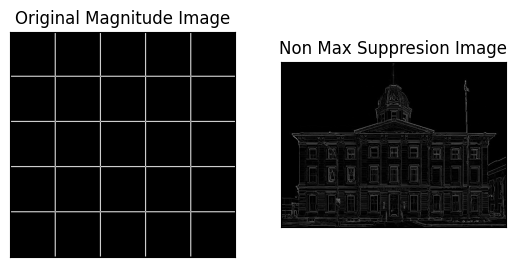

In [9]:
# Comput gradient magnitude
harBoardGrad_mag = np.sqrt(sqrBoard_x + sqrBoard_y)
harHouseGrad_mag = np.sqrt(sqrHouse_x + sqrHouse_y)
# Compute gradient orientation
harBoardGrad_orient = np.arctan2(sqrBoard_y, sqrBoard_x)
harHouseGrad_orient = np.arctan2(sqrHouse_y, sqrHouse_x)

# Call the non_max_surpressing function
board_nms =  non_max_suppression(harBoardGrad_mag, harBoardGrad_orient)
house_nms =  non_max_suppression(harHouseGrad_mag, harHouseGrad_orient)

# display images
plt.subplot(121), plt.imshow(board_nms, cmap="gray")
plt.title("Original Magnitude Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(house_nms, cmap="gray")
plt.title("Non Max Suppresion Image"), plt.xticks([]), plt.yticks([])
plt.show()

****

# **2. SIFT Features**

# **Read Image**

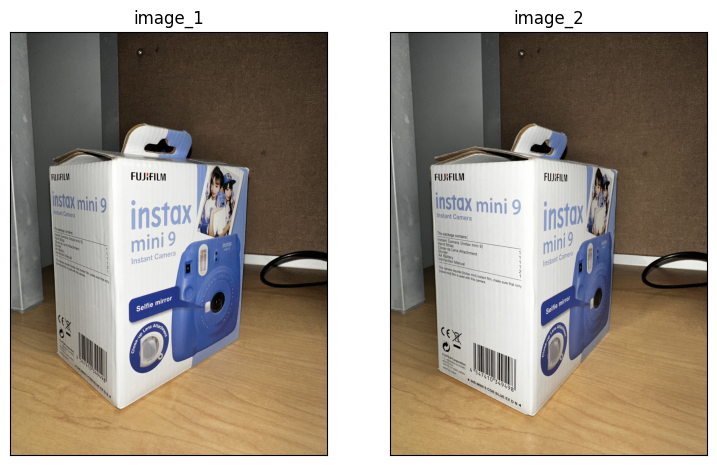

In [10]:
# Read in the image
image1 = cv2.imread(path + 'intax1.jpg')
image2 = cv2.imread(path + 'intax2.jpg')

# Convert from RGB value to GBR value
image_1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image_2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(9,12))
plt.subplot(121), plt.imshow(image_1)
plt.title("image_1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(image_2)
plt.title("image_2"), plt.xticks([]), plt.yticks([])

plt.show()

# **2.1 SIFT in a nutshell**
1. Generate a scale-space image pyramid
2. SIFT key localization
3. Eliminating unstable keypoints
4. Select a canonical orientation for the SIFT keypoint

# **2.2  SIFT between two different pictures**



*  **Compute SIFT keypoints**



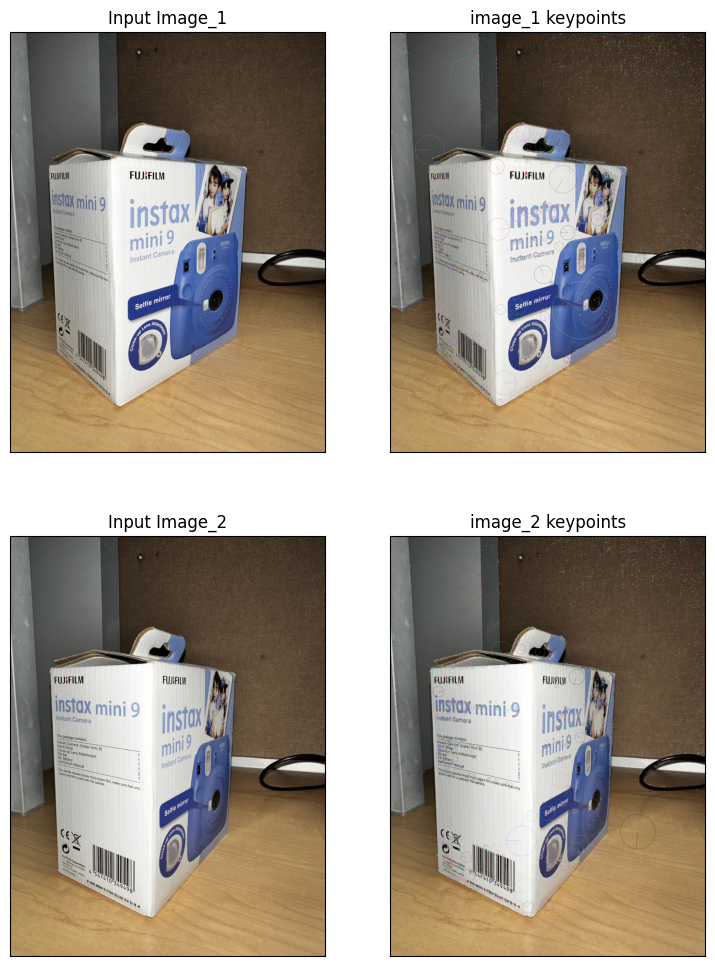

In [11]:
# Copy images
image1Disp = image_1.copy()
image2Disp = image_2.copy()

image1Disp = cv2.cvtColor(image1Disp, cv2.COLOR_BGR2RGB)
image2Disp = cv2.cvtColor(image1Disp, cv2.COLOR_BGR2RGB)
# Constuct a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# detect SIFT features, with no masks
# Ref: https://docs.opencv.org/master/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887
keypoints1 = sift.detect(image_1, None)
keypoints2 = sift.detect(image_2, None)

# draw the keypoints
# Ref: https://docs.opencv.org/3.4/d4/d5d/group__features2d__draw.html#gab958f8900dd10f14316521c149a60433
cv2.drawKeypoints(image_1, keypoints1, image1Disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(image_2, keypoints2, image2Disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display
plt.figure(figsize=(9,12))
plt.subplot(221), plt.imshow(image_1)
plt.title("Input Image_1"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(image1Disp)
plt.title("image_1 keypoints"), plt.xticks([]), plt.yticks([])

plt.subplot(223), plt.imshow(image_2)
plt.title("Input Image_2"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(image2Disp)
plt.title("image_2 keypoints"), plt.xticks([]), plt.yticks([])
plt.show()


 *  **Match and display keypoints between two images using a brute-force method**



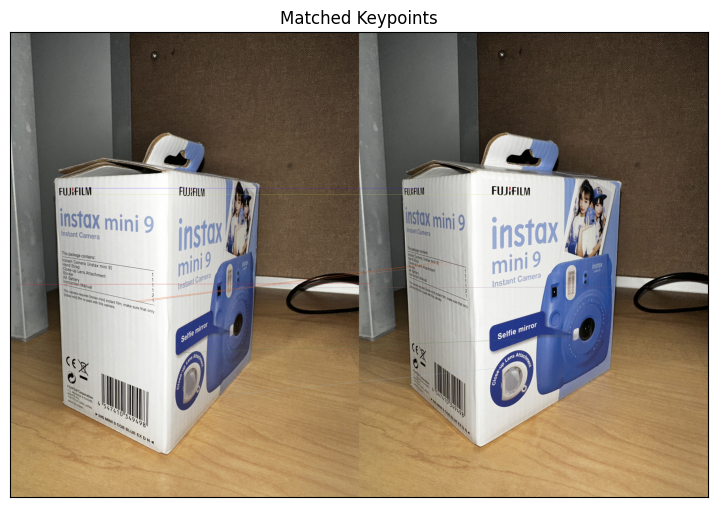

In [12]:
# Constuct a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
#Detect and compute keypoints and descriptors
keypoints_1, descriptors_1 = sift.detectAndCompute(image_1, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(image_2, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_2, descriptors_1) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_match = cv2.drawMatches(image_2, keypoints_2, image_1, keypoints_1, matches[:10], None, flags=2)

# Display
plt.figure(figsize=(9,12))
plt.imshow(keypoints_match)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

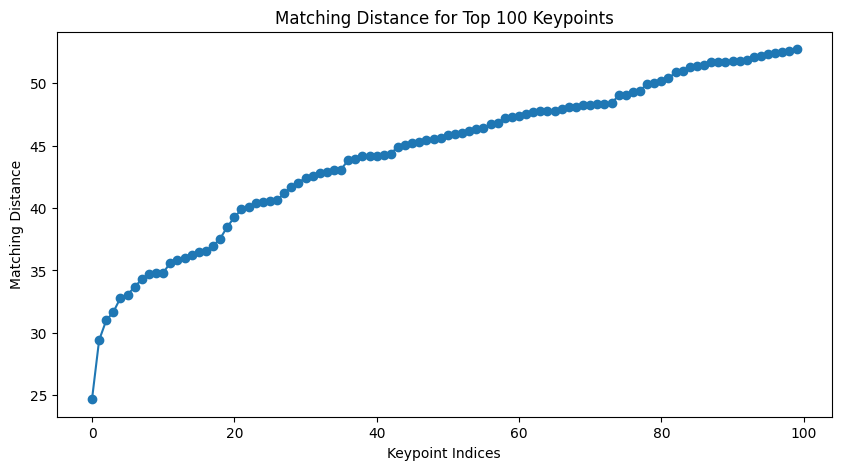

In [13]:
# Extract the distances
matching_distances = [match.distance for match in matches[:100]]

# Create a list of indices (0 to 99)
keypoint_indices = list(range(100))

# Create the plot
plt.figure(figsize=(10, 5))

# Plot each set of data with a different color
plt.plot(keypoint_indices, matching_distances, marker='o', linestyle='-')

# Set labels and title
plt.xlabel('Keypoint Indices')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Keypoints')

# Show the plot
plt.show()

# **2.3 Invariance Under Scale**



*   **Scale image 1**



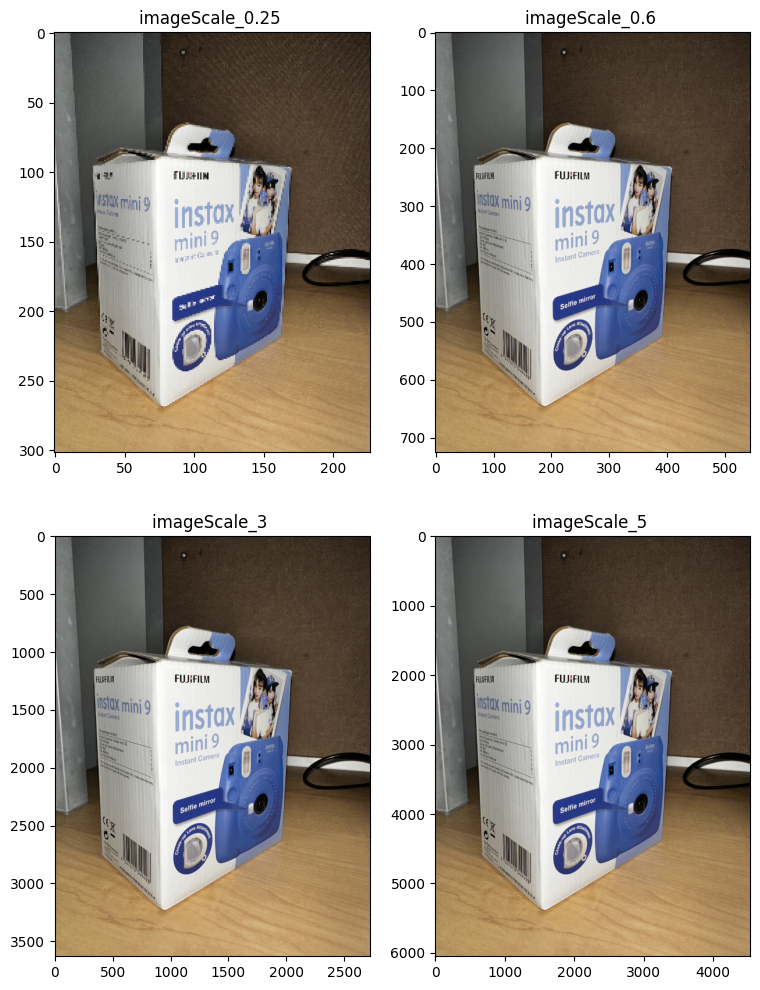

In [14]:
#Scale down image1 first
image_1ScaleDown =  cv2.resize(image_1, None, fx = 0.3, fy = 0.3) # Scalling down image_1 first makes sure scaling it up later will not crash GoogleColab RAM

imageScale1 = cv2.resize(image_1ScaleDown, None, fx = 0.25, fy = 0.25)
imageScale2 = cv2.resize(image_1ScaleDown, None, fx = 0.6, fy = 0.6)
imageScale3 = cv2.resize(image_1ScaleDown, None, fx = 3, fy = 3)
imageScale4 = cv2.resize(image_1ScaleDown, None, fx = 5, fy = 5)

# Display
plt.figure(figsize=(9,12))
plt.subplot(221)
plt.imshow(imageScale1)
plt.title("imageScale_0.25 ")

plt.subplot(222)
plt.imshow(imageScale2)
plt.title("imageScale_0.6 ")

plt.subplot(223)
plt.imshow(imageScale3)
plt.title("imageScale_3 ")

plt.subplot(224)
plt.imshow(imageScale4)
plt.title("imageScale_5 ")
plt.show()


*  **Display matching keypoints of scaled images and image_1**



1. **Scaling factor = 0.25**




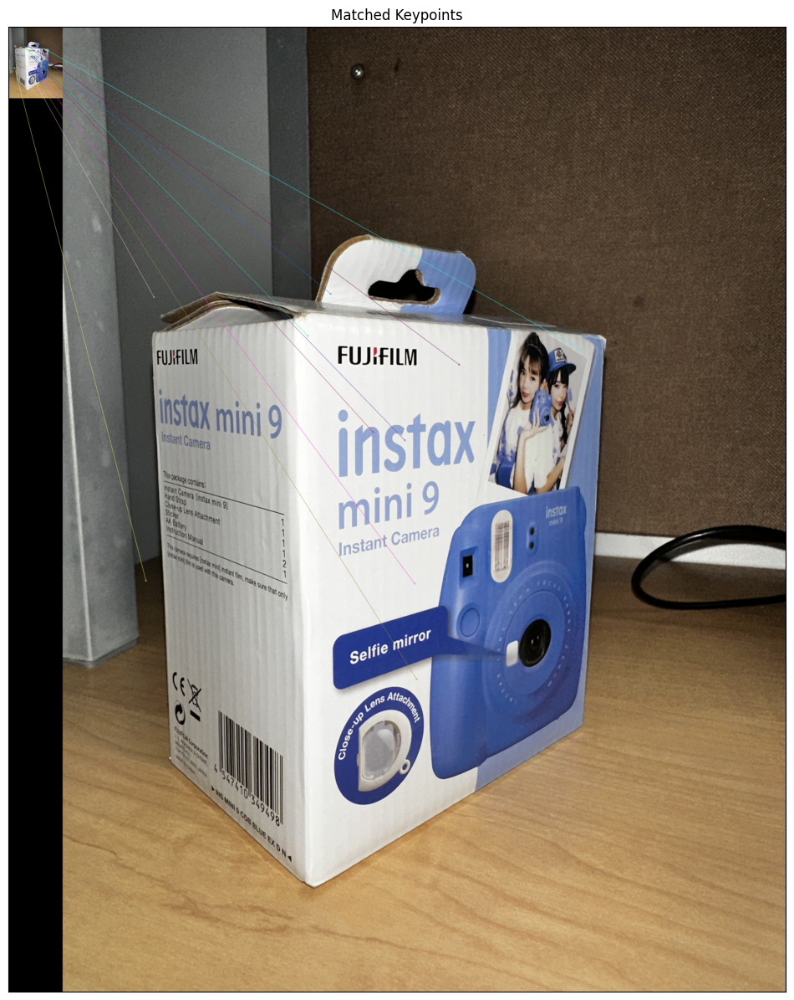

In [15]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Constuct a SIFT object
sift = cv2.xfeatures2d.SIFT_create()
# create BFMatcher object
bf = cv2.BFMatcher()

imageScale1_Disp = imageScale1.copy()
imageScale1_Disp = cv2.cvtColor(imageScale1_Disp, cv2.COLOR_BGR2RGB)
keypointsScale1, descriptorsScale1 = sift.detectAndCompute(imageScale1_Disp, None)

matches1 = bf.match(descriptorsScale1, descriptors_1) # query image, train image
matches1 = sorted(matches1, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_match1 = cv2.drawMatches(imageScale1, keypointsScale1, image_1, keypoints_1, matches1[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_match1)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()


2. **Scaling factor = 0.6**


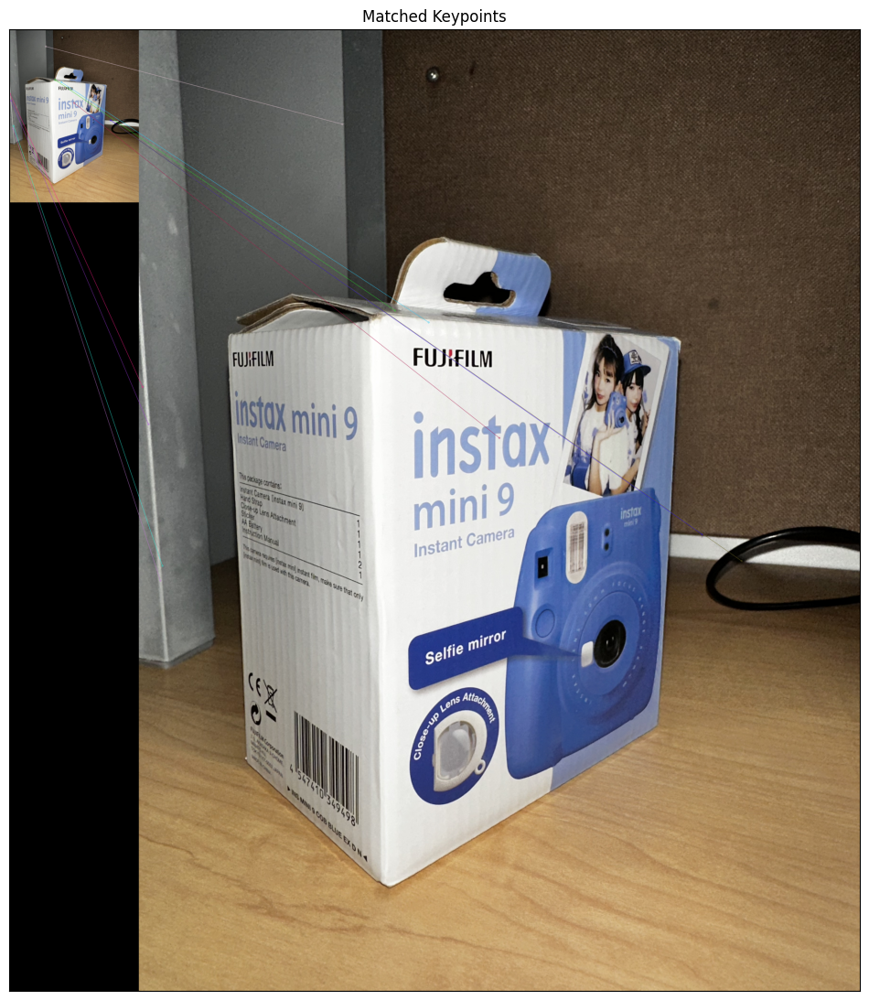

In [16]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
imageScale2_Disp = imageScale2.copy()
imageScale2_Disp = cv2.cvtColor(imageScale2_Disp, cv2.COLOR_BGR2RGB)
keypointsScale2, descriptorsScale2 = sift.detectAndCompute(imageScale2_Disp, None)

matches2 = bf.match(descriptorsScale2, descriptors_1) # query image, train image
matches2  = sorted(matches2, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_match2 = cv2.drawMatches(imageScale2, keypointsScale2, image_1, keypoints_1, matches2[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_match2)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

3. **Scaling factor = 3**



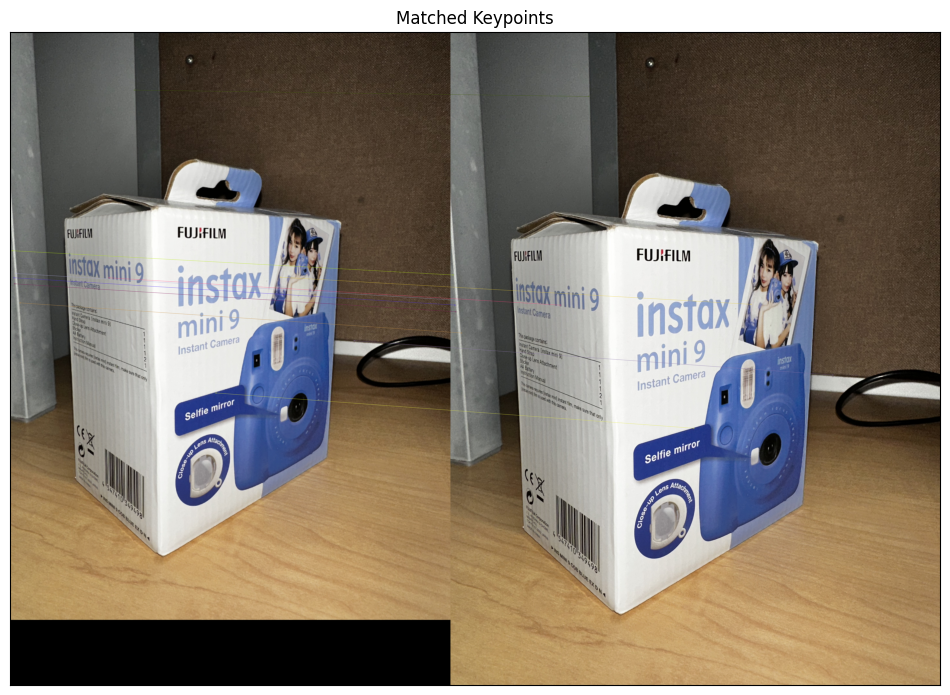

In [17]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
imageScale3_Disp = imageScale3.copy()
imageScale3_Disp = cv2.cvtColor(imageScale3_Disp, cv2.COLOR_BGR2RGB)
keypointsScale3, descriptorsScale3 = sift.detectAndCompute(imageScale3_Disp, None)

matches3 = bf.match(descriptorsScale3, descriptors_1) # query image, train image
matches3 = sorted(matches3, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_match3 = cv2.drawMatches(imageScale3, keypointsScale3, image_1, keypoints_1, matches3[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_match3)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()


4. **Scaling factor = 5**

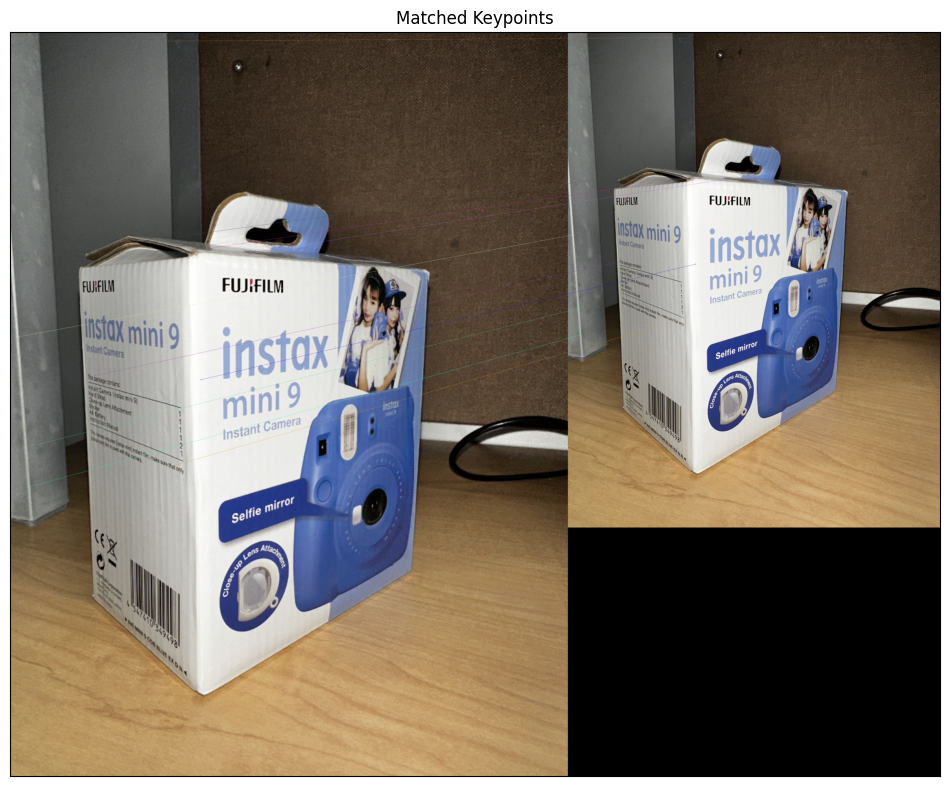

In [18]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
imageScale4_Disp =imageScale4.copy()
imageScale4_Disp = cv2.cvtColor(imageScale4_Disp, cv2.COLOR_BGR2RGB)
keypointsScale4, descriptorsScale4 = sift.detectAndCompute(imageScale4_Disp, None)

matches4 = bf.match(descriptorsScale4, descriptors_1) # query image, train image
matches4 = sorted(matches4, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_match4 = cv2.drawMatches(imageScale4, keypointsScale4, image_1, keypoints_1, matches4[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_match4)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()



*   **Plot the matching distance for the top 100 matched keypoints**





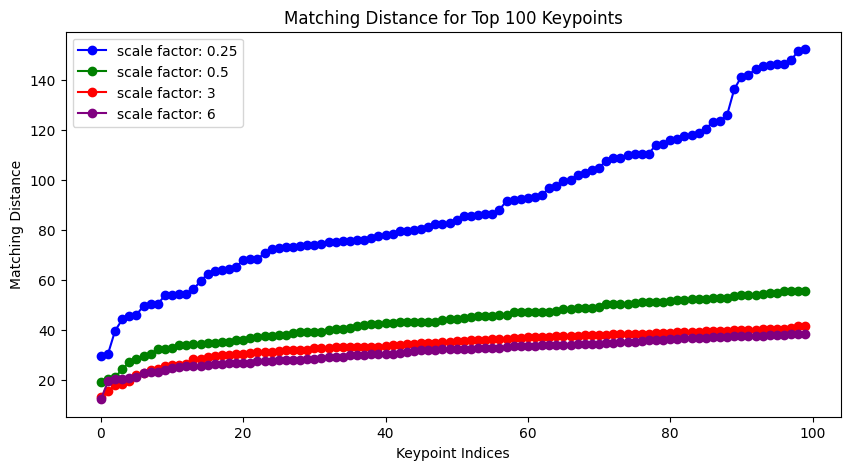

In [19]:
# Extract the distances
matching_distances1 = [match.distance for match in matches1[:100]]
matching_distances2 = [match.distance for match in matches2[:100]]
matching_distances3 = [match.distance for match in matches3[:100]]
matching_distances4 = [match.distance for match in matches4[:100]]

# Create a list of indices (0 to 99)
keypoint_indices1 = list(range(100))
keypoint_indices2 = list(range(100))
keypoint_indices3 = list(range(100))
keypoint_indices4 = list(range(100))

# Create the plot
plt.figure(figsize=(10, 5))

# Plot each set of data with a different color
plt.plot(keypoint_indices1, matching_distances1, marker='o', linestyle='-', label='scale factor: 0.25', color='blue')
plt.plot(keypoint_indices2, matching_distances2, marker='o', linestyle='-', label='scale factor: 0.5', color='green')
plt.plot(keypoint_indices3, matching_distances3, marker='o', linestyle='-', label='scale factor: 3', color='red')
plt.plot(keypoint_indices4, matching_distances4, marker='o', linestyle='-', label='scale factor: 6', color='purple')

# Set labels and title
plt.xlabel('Keypoint Indices')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Keypoints')

# Add legend
plt.legend()

# Show the plot
plt.show()

As the scale increases, a corresponding descent in matching distance is typically observed. This suggests that SIFT is highly effective in feature matching when images are scaled up and indicates a robustness of SIFT to changes in scale. This behavior aligns with a fundamental property of SIFT, which is its scale invariance.

****

# **2.3 Invariance Under Rotation**



*   **Rotate image_1**




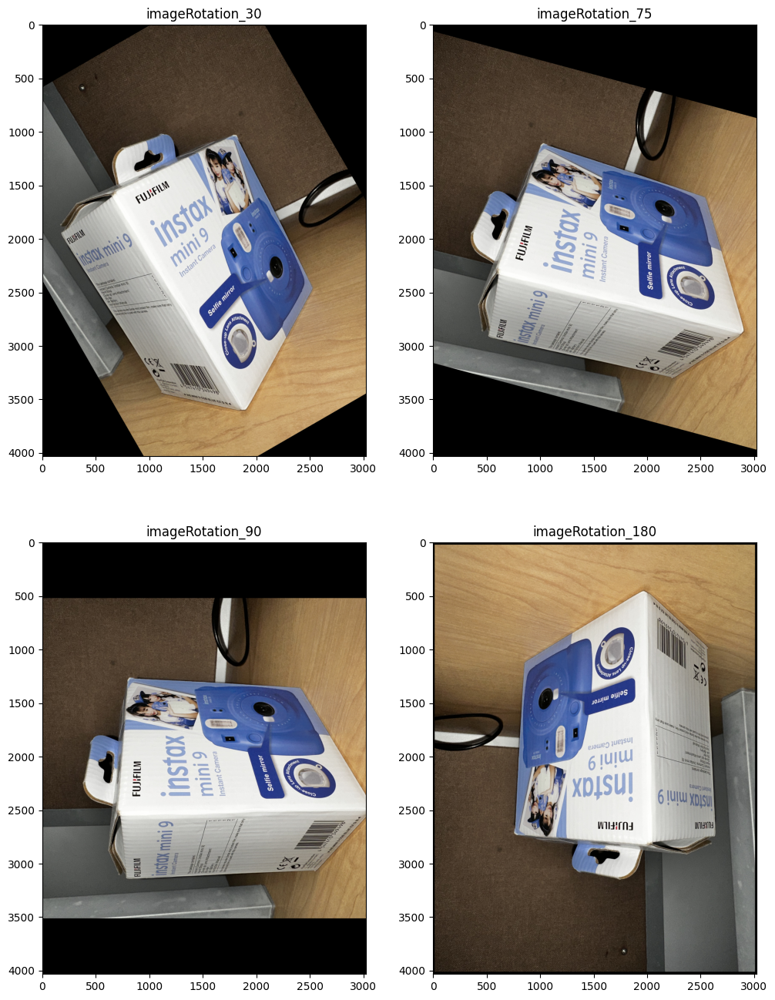

In [20]:
# Get image centre
h = image_1.shape[1]
w = image_1.shape[0]
centre = (h/2, w/2)
# Scale down image_1 a little bit to get the plotted result of rotation angle = 90° and 180°, or the result will be extremely inaccurate.
scale = 0.99

# Get rotation matrix
rotationMatrix_30 = cv2.getRotationMatrix2D(center = centre, angle = 30, scale = scale)
rotationMatrix_75 = cv2.getRotationMatrix2D(center = centre, angle = 75, scale = scale)
rotationMatrix_90 = cv2.getRotationMatrix2D(center = centre, angle = 90, scale = scale)
rotationMatrix_180 = cv2.getRotationMatrix2D(center = centre, angle = 180, scale = scale)

# Get rotated image
imageRotation1 = cv2.warpAffine(image_1, rotationMatrix_30, (h,w))
imageRotation2 = cv2.warpAffine(image_1, rotationMatrix_75, (h,w))
imageRotation3 = cv2.warpAffine(image_1, rotationMatrix_90, (h,w))
imageRotation4 = cv2.warpAffine(image_1,  rotationMatrix_180, (h,w))

# Display
plt.figure(figsize=(12,16))
plt.subplot(221)
plt.imshow(imageRotation1)
plt.title("imageRotation_30")

plt.subplot(222)
plt.imshow(imageRotation2)
plt.title("imageRotation_75")

plt.subplot(223)
plt.imshow(imageRotation3)
plt.title("imageRotation_90")

plt.subplot(224)
plt.imshow(imageRotation4)
plt.title("imageRotation_180")
plt.show()



*  **Display matching keypoints of scaled images and image_1**





1.   **Rotate at angle = 30°**



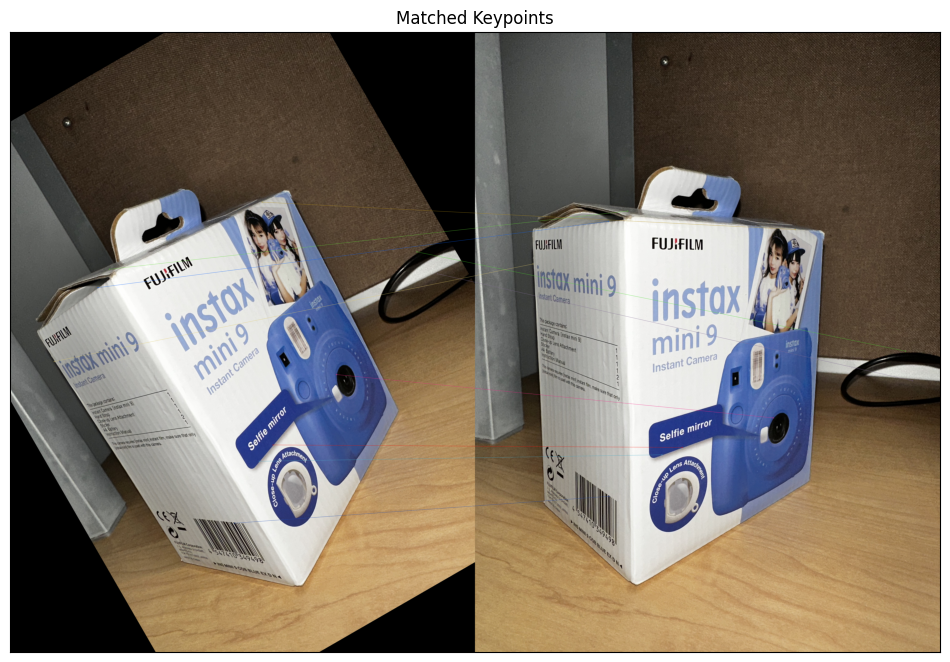

In [21]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
keypointsRotation1, descriptorsRotation1 = sift.detectAndCompute(imageRotation1, None)

matches_30 = bf.match(descriptorsRotation1, descriptors_1) # query image, train image
matches_30 = sorted(matches_30, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_matchR1 = cv2.drawMatches(imageRotation1, keypointsRotation1, image_1, keypoints_1, matches_30[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_matchR1)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

2. **Rotate at angle = 75°**

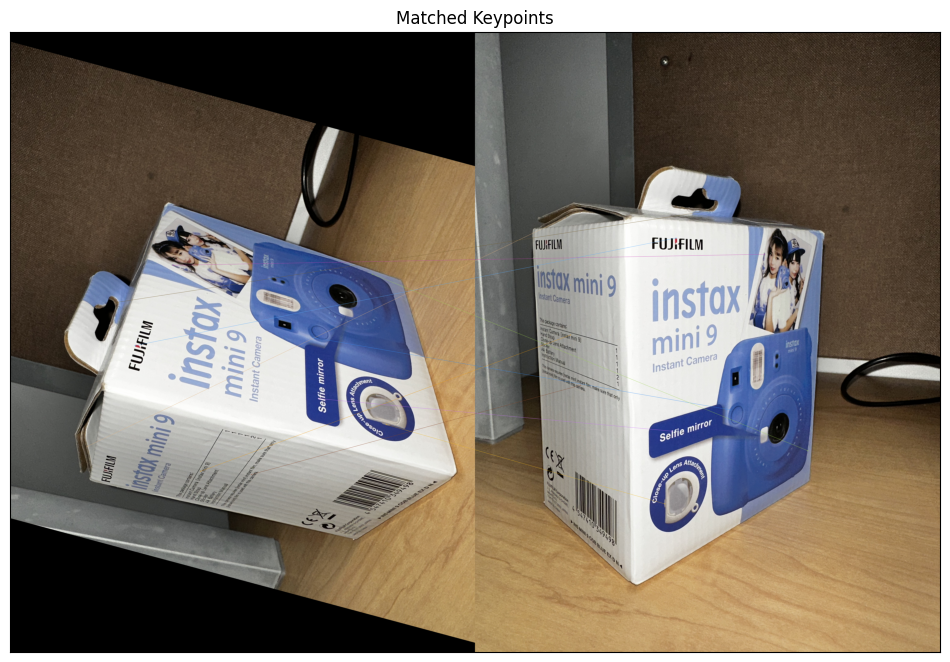

In [22]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
keypointsRotation2, descriptorsRotation2 = sift.detectAndCompute(imageRotation2, None)

matches_75 = bf.match(descriptorsRotation2, descriptors_1) # query image, train image
matches_75 = sorted(matches_75, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_matchR2 = cv2.drawMatches(imageRotation2, keypointsRotation2, image_1, keypoints_1, matches_75[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_matchR2)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

3. **Rotate at angle = 90°**

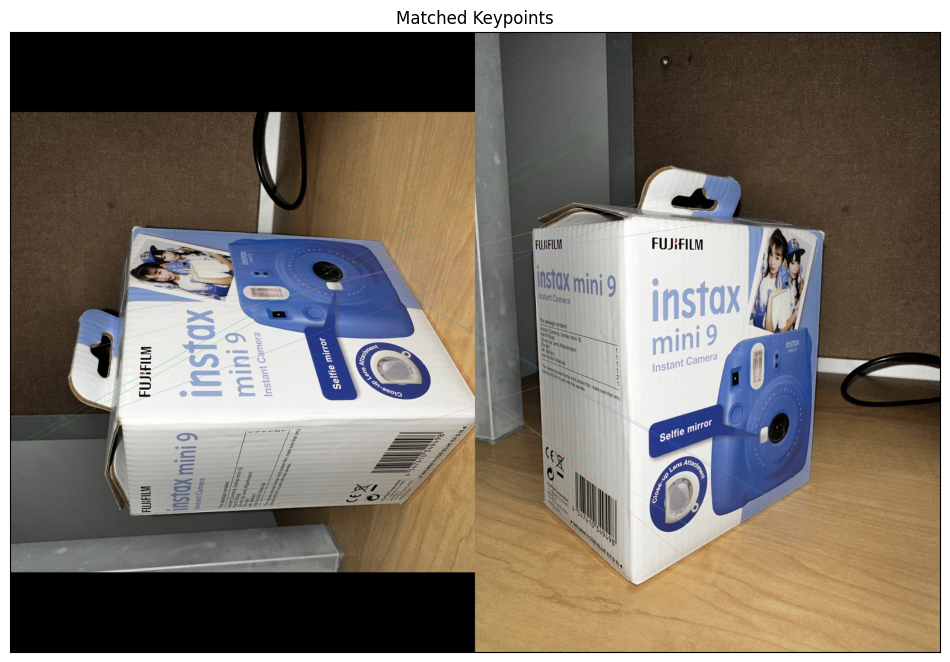

In [23]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
keypointsRotation3, descriptorsRotation3 = sift.detectAndCompute(imageRotation3, None)

matches_90 = bf.match(descriptorsRotation3, descriptors_1) # query image, train image
matches_90 = sorted(matches_90, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_matchR3 = cv2.drawMatches(imageRotation3, keypointsRotation3, image_1, keypoints_1, matches_90[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_matchR3)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

4. **Rotate at angle = 180°**

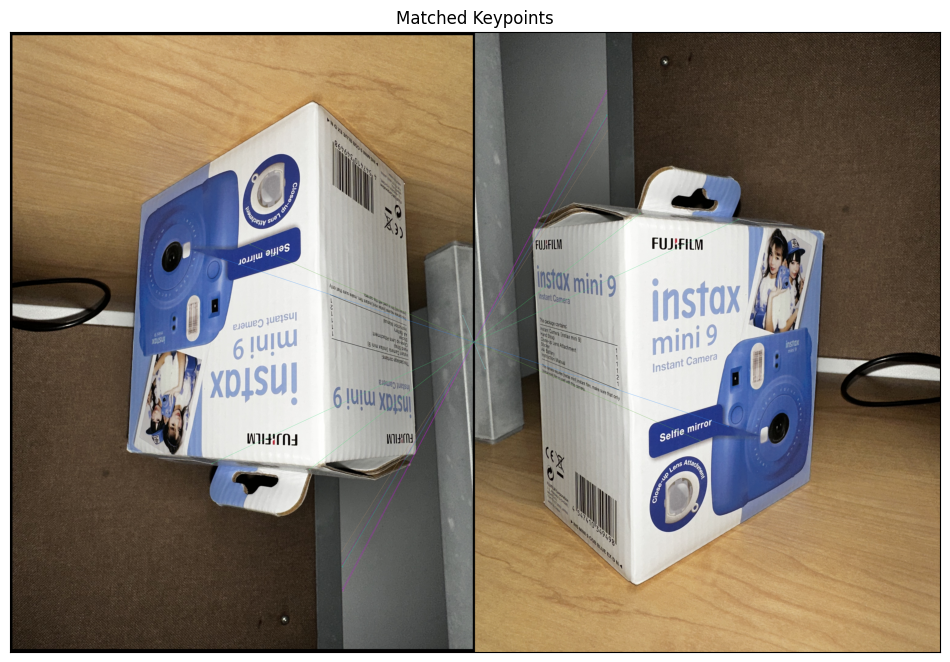

In [24]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
keypointsRotation4, descriptorsRotation4 = sift.detectAndCompute(imageRotation4, None)

matches_180 = bf.match(descriptorsRotation4, descriptors_1) # query image, train image
matches_180 = sorted(matches_180, key = lambda x:x.distance)

# Draw keypoints (choose top ten)
keypoints_matchR4 = cv2.drawMatches(imageRotation4, keypointsRotation4, image_1, keypoints_1, matches_180[:10], None, flags=2)

# Display
plt.figure(figsize=(12,16))
plt.imshow(keypoints_matchR4)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

* **Plot the matching distance for the top 100 matched keypoints**

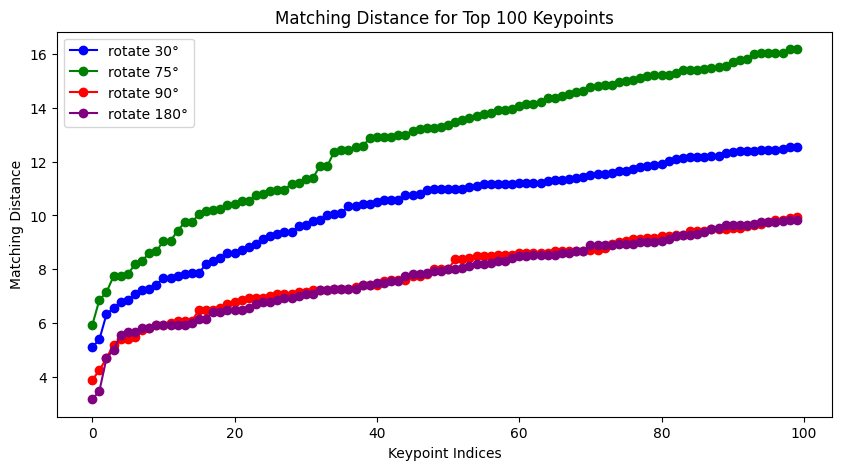

In [25]:
# Extract the distances
matching_distances30 = [match.distance for match in matches_30[:100]]
matching_distances75 = [match.distance for match in matches_75[:100]]
matching_distances90 = [match.distance for match in matches_90[:100]]
matching_distances180 = [match.distance for match in matches_180[:100]]

# Create a list of indices (0 to 99)
keypoint_indices30 = list(range(100))
keypoint_indices75 = list(range(100))
keypoint_indices90 = list(range(100))
keypoint_indices180 = list(range(100))

# Create the plot
plt.figure(figsize=(10, 5))

# Plot each set of data with a different color
plt.plot(keypoint_indices30, matching_distances30, marker='o', linestyle='-', label='rotate 30°', color='blue')
plt.plot(keypoint_indices75, matching_distances75, marker='o', linestyle='-', label='rotate 75°', color='green')
plt.plot(keypoint_indices90, matching_distances90, marker='o', linestyle='-', label='rotate 90°', color='red')
plt.plot(keypoint_indices180, matching_distances180, marker='o', linestyle='-', label='rotate 180°', color='purple')

# Set labels and title
plt.xlabel('Keypoint Indices')
plt.ylabel('Matching Distance')
plt.title('Matching Distance for Top 100 Keypoints')

# Add legend
plt.legend()

# Show the plot
plt.show()

Observing the plotted result, I noticed that with identical keypoint indices, the highest matching distance is observed when the image is rotated by 75 degrees. Following closely, the second highest matching distance is evident at a rotation angle of 30 degrees. Notably, the matching distances for rotation angles of 90 and 180 degrees are remarkably similar across all keypoints.

SIFT is designed to be robust to a certain degree of rotation. However, extreme rotations can challenge this robustness. The behavior I observed highlights the practical limitations of feature matching when images undergo significant transformations.

****

# **3. Image Stitching**

# **Read Image**

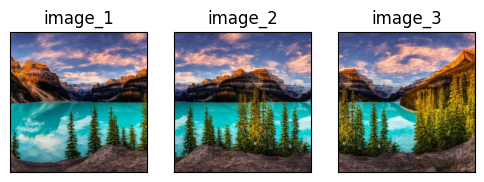

In [26]:
# Read in the image
imagep1 = cv2.imread(path + 'part1.png')
imagep2 = cv2.imread(path + 'part2.png')
imagep3 = cv2.imread(path + 'part3.png')

# Convert from RGB value to GBR value
image_p1 = cv2.cvtColor(imagep1, cv2.COLOR_BGR2RGB)
image_p2 = cv2.cvtColor(imagep2, cv2.COLOR_BGR2RGB)
image_p3 = cv2.cvtColor(imagep3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,8))
plt.subplot(131), plt.imshow(image_p1)
plt.title("image_1"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(image_p2)
plt.title("image_2"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(image_p3)
plt.title("image_3"), plt.xticks([]), plt.yticks([])

plt.show()

 1.  **Match and display keypoints between image1 and image2**

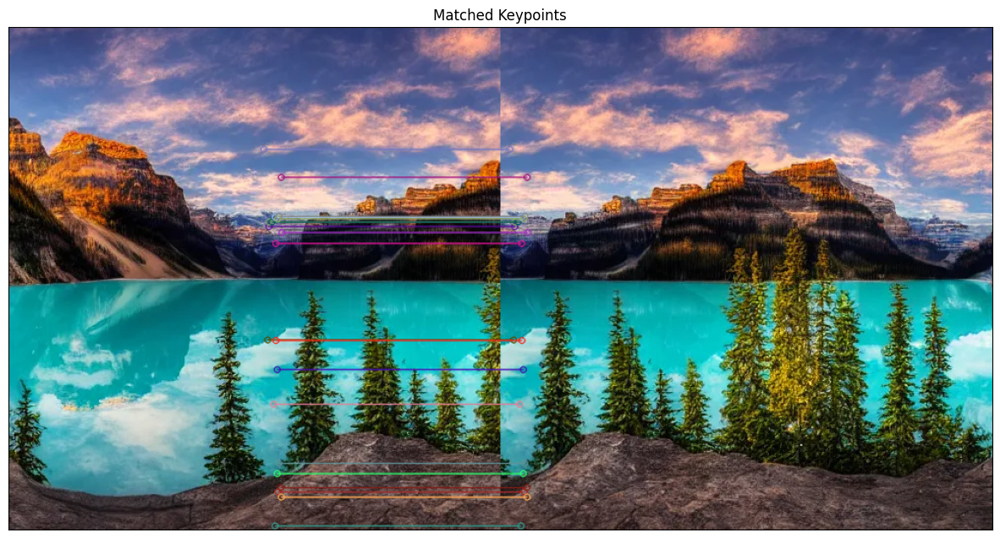

In [27]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Compute the SIFT keypoints and corresponding descriptors for images 1 and 2

# Copy images
image_p1Disp = image_p1.copy()
image_p2Disp = image_p2.copy()

image_p1Disp = cv2.cvtColor(image_p1Disp, cv2.COLOR_BGR2RGB)
image_p1Disp = cv2.cvtColor(image_p1Disp, cv2.COLOR_BGR2RGB)
# Constuct a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Detect and compute keypoints
keypoints_p1, descriptors_p1 = sift.detectAndCompute(image_p1, None)
keypoints_p2, descriptors_p2 = sift.detectAndCompute(image_p2, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_p1, descriptors_p2) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints (choose top twenty)
keypoints_match = cv2.drawMatches(image_p1, keypoints_p1, image_p2, keypoints_p2, matches[:20], None, flags=2)

# Display
plt.figure(figsize=(15,15))
plt.imshow(keypoints_match)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

2.  **Stitch the transformed image 1 and the original image 2**

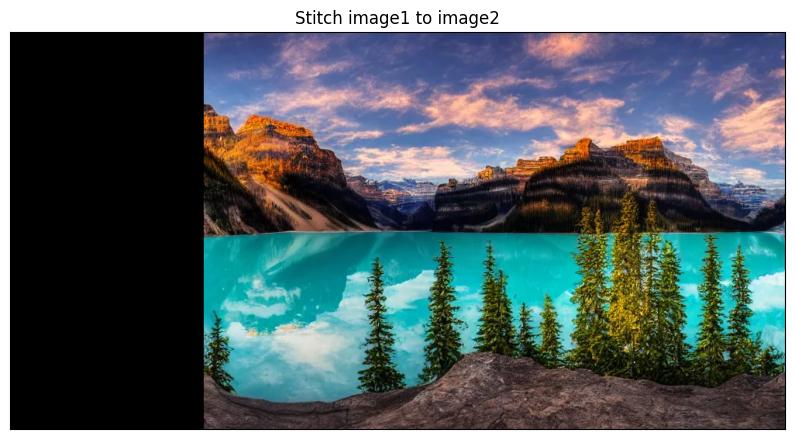

In [28]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))

mp1 = np.float32([keypoints_p1[i].pt for (__, i) in GoodMatches]) #the original plane
mp2 = np.float32([keypoints_p2[i].pt for (i, __) in GoodMatches]) #the target plane

# find homography (image1) and wrap image accordingly
# Ref: https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#findhomography
H, __ = cv2.findHomography(mp2, mp1, cv2.RANSAC, 4)\

#Stitch image1 to image2
# Ref: https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87
image12 = cv2.warpPerspective(image_p1, H, (image_p1.shape[1]+image_p2.shape[1],image_p1.shape[0]), flags = cv2.INTER_LINEAR)
image12[:, image_p1.shape[1]:,:] = image_p2

plt.figure(figsize=(10,10))
plt.imshow(image12)
plt.title("Stitch image1 to image2"), plt.xticks([]), plt.yticks([])
plt.show()

3. **Find the matching keypoints in image12 and image3**

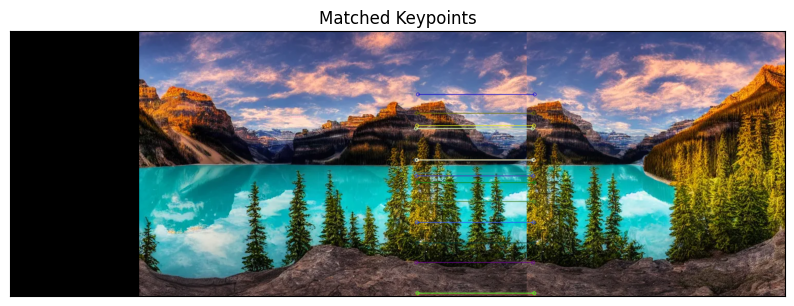

In [29]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Compute the SIFT keypoints and corresponding descriptors for images 12 and 3
# Copy images
image12Disp = image12.copy()
image_p3Disp = image_p3.copy()

image12Disp = cv2.cvtColor(image12Disp, cv2.COLOR_BGR2RGB)
image_p3Disp = cv2.cvtColor(image_p3Disp, cv2.COLOR_BGR2RGB)
# Constuct a SIFT object
sift = cv2.xfeatures2d.SIFT_create()

# This piece of code is from Tutorial 3 - Image Processing in OpenCV
# Detect and compute keypoints
keypoints12, descriptors12 = sift.detectAndCompute(image12, None)
keypoints_p3, descriptors_p3 = sift.detectAndCompute(image_p3, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors12, descriptors_p3) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints (choose top twenty)
keypoints_match = cv2.drawMatches(image12, keypoints12, image_p3, keypoints_p3, matches[:20], None, flags=2)

# Display
plt.figure(figsize=(10,10))
plt.imshow(keypoints_match)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

4. **Stitch the transformed image 3 and image 12 together**

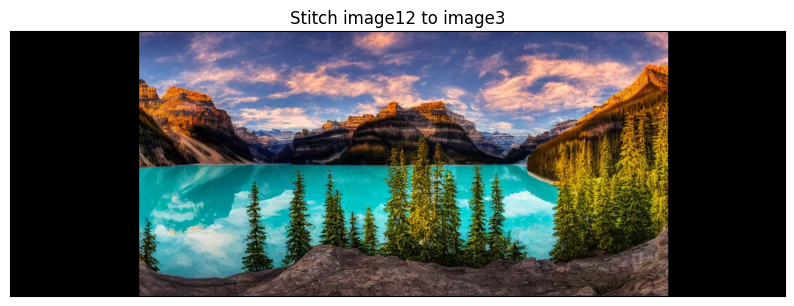

In [30]:
# This piece of code is from Tutorial 4 - Feature Detection in OpenCV
# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000:
        GoodMatches.append((m.trainIdx, m.queryIdx))

mp12 = np.float32([keypoints12[i].pt for (__, i) in GoodMatches]) #the original plane
mp3 = np.float32([keypoints_p3[i].pt for (i, __) in GoodMatches]) #the target plane

# find homography and wrap image accordingly
# Ref: https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#findhomography
H, __ = cv2.findHomography(mp3, mp12, cv2.RANSAC, 4)\

#Stitch image1 to image2
# Ref: https://docs.opencv.org/master/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87
image123 = cv2.warpPerspective(image_p3, H, (image12.shape[1]+image_p3.shape[1],image12.shape[0]), flags = cv2.INTER_LINEAR)
image123[: ,:image12.shape[1],:] = image12

plt.figure(figsize=(10,10))
plt.imshow(image123)
plt.title("Stitch image12 to image3"), plt.xticks([]), plt.yticks([])
plt.show()

Pyramid blending is preferred when there are significant exposure or color differences between the to-be-stitched images. It can also handle cases where there are large disparities in contrast or brightness levels. Additionally, pyramid blending can be more effective when dealing with images of different sizes or resolutions.